## **MASTER'S DEGREE IN APPLIED ARTIFICIAL INTELLIGENCE.**

**Course:** TC5035.10 - Integration project

**Tecnológico de Monterrey**

**Professor:** Dra. Grettel Barceló Alonso

**Provessor:** Dr. Luis Eduardo Falcón Morales

**Advisory Professor:** María de la Paz Rico Fernández

### **Week 3, Activity 3**

Progress 1: EDA - Exploratory Data Analysis

###**Team 12:**

Luis Ángel Seda Marcos
A01795301@tec.mx

Christopher Flores González
A01795419@tec.mx

Luis Felipe Nicanor Gutiérrez
A01795631@tec.mx

## **Objective**


Build the technical foundation (data and model prototypes) for the automatic recognition of dynamic LSM gestures using computer vision. The impacted business process is the development of accessibility solutions (e.g., interpretation assistants, rich subtitling, hands-free interfaces), with potential transfer to government (procedures and citizen care) and healthcare (telemedicine and clinical consultations with a virtual interpreter), as well as the education sector (accessible classes and materials).

Due to time constraints, the current version of the project focuses solely on dynamic gestures, specifically completing the alphabet.

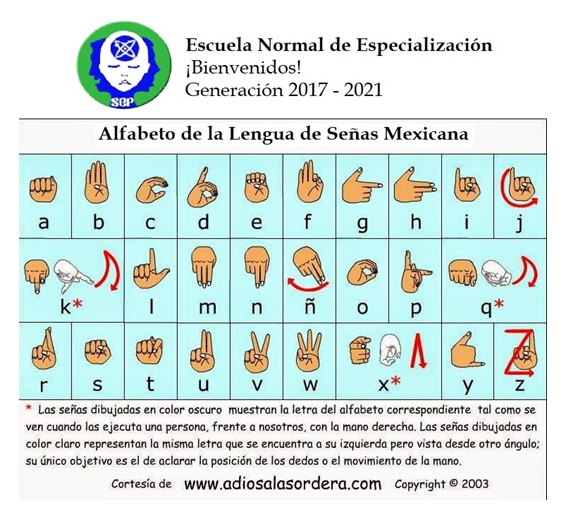

## **Instructions**

This first step involves performing exploratory data analysis (EDA), that is, describing the data using statistical and visualization techniques (univariate and bivariate/multivariate analysis) to focus on its most relevant aspects, as well as applying and justifying preprocessing operations related to the handling of missing values, outliers, and high cardinality. It is important to include your EDA conclusions, identifying important trends or relationships.

# **Setup and Imports**

Importing necessary libraries for data manipulation (pandas, numpy), visualization (matplotlib, seaborn, missingno), video processing (cv2), and landmark extraction (mediapipe).
File Path Definitions: Defines paths for the datasets and output CSV files.

In [32]:
import os, csv
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Video, display
import missingno as msno
import math
import mediapipe as mp
import cv2
from tabulate import tabulate

In [33]:
dataset_frontal = Path("../../src/datasets/MSL-dynamic-signs")
dataset_profile = Path("../../src/datasets/MSL-dynamic-profile-signs")
output_csv = "../../src/files/clips_meta.csv"
features_csv ="../../src/files/clips_features.csv"

This function is defined to extract metadata and basic visual quality metrics (like brightness and blur) from video files.

In [34]:
def probe_video(path, sample_rate=10):
    """Returns metadata and simple visual quality metrics"""
    cap = cv2.VideoCapture(str(path))
    if not cap.isOpened():
        return None

    width  = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    fps = cap.get(cv2.CAP_PROP_FPS)
    n_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    duration = n_frames / fps if fps > 0 else 0
    file_size = os.path.getsize(path)

    brightness_vals, blur_vals = [], []
    frame_id = 0
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        if frame_id % sample_rate == 0:
            gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            brightness_vals.append(np.mean(gray))
            blur_vals.append(cv2.Laplacian(gray, cv2.CV_64F).var())
        frame_id += 1
    cap.release()

    return {
        "fps": fps,
        "n_frames": n_frames,
        "duration": duration,
        "width": width,
        "height": height,
        "file_size": file_size,
        "brightness_mean": np.mean(brightness_vals) if brightness_vals else None,
        "brightness_std": np.std(brightness_vals) if brightness_vals else None,
        "blur_mean": np.mean(blur_vals) if blur_vals else None
    }

These functions are responsible for iterating through the dataset directories, calling probe_video for each video, and building a list of dictionaries containing the video metadata. build_meta_letter seems to be specifically for a dataset organized by letter, while build_meta handles a train/test split structure.

In [35]:
def build_meta_letter(root, view_label):
    rows = []
    # Recorre todas las carpetas de letras
    for letter_dir in root.iterdir():
        if not letter_dir.is_dir():
            continue
        for video_path in letter_dir.glob("*.mp4"):
            fname = video_path.stem
            parts = fname.split("-")
            if len(parts) != 4:
                continue
            subject, letter, view, rep = parts
            stats = probe_video(video_path)
            if not stats:
                continue
            row = {
                "clip_id": fname,
                "class_id": letter,
                "signer_id": subject,
                "view": view_label,
                "repetition": rep,
                "path": str(video_path),
                "split": letter_dir.name  # ahora el split es la letra
            }
            row.update(stats)
            rows.append(row)
    return rows

In [36]:
def build_meta(root, view_label):
    rows = []
    for subset in ["train", "test"]:
        subset_path = root / subset
        if not subset_path.exists():
            continue
        for video_path in subset_path.glob("*.mp4"):
            fname = video_path.stem
            parts = fname.split("-")
            if len(parts) != 4:
                continue
            subject, letter, view, rep = parts
            stats = probe_video(video_path)
            if not stats:
                continue
            row = {"clip_id": fname, "class_id": letter, "signer_id": subject,
                   "view": view_label, "repetition": rep, "path": str(video_path), "split": subset}
            row.update(stats)
            rows.append(row)
    return rows

This function uses MediaPipe to detect hands and extract 3D landmark coordinates from each frame of a video.

In [37]:
def extract_landmarks(video_path: str) -> pd.DataFrame:
    # Abrir el video
    cap = cv2.VideoCapture(video_path)
    
    # Inicializar el modelo de MediaPipe Hands
    hands = mp_hands.Hands(static_image_mode=False, max_num_hands=1,
                           min_detection_confidence=0.5, min_tracking_confidence=0.5)
    
    # Lista para almacenar los resultados de los landmarks
    rows = []
    
    # Contador de frames
    frame_idx = 0
    
    while True:
        # Leer cada frame del video
        ret, frame = cap.read()
        
        if not ret:
            break  # Salir del loop si no hay más frames
        
        # Convertir el frame a RGB para usarlo con MediaPipe
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
        # Procesar el frame con el modelo de MediaPipe Hands
        results = hands.process(frame_rgb)
        
        # Si se detectan landmarks de la mano
        if results.multi_hand_landmarks:
            # Inicializar un diccionario para almacenar los landmarks de este frame
            frame_landmarks = {"frame_id": frame_idx}
            
            # Para cada landmark, guardar las coordenadas x, y, z
            for lm_id, lm in enumerate(results.multi_hand_landmarks[0].landmark):
                frame_landmarks[f"x_{lm_id}"] = lm.x
                frame_landmarks[f"y_{lm_id}"] = lm.y
                frame_landmarks[f"z_{lm_id}"] = lm.z
            
            # Agregar los datos del frame a la lista de registros
            rows.append(frame_landmarks)
        
        # Incrementar el índice del frame
        frame_idx += 1
    
    # Liberar el objeto del video
    cap.release()
    
    # Cerrar el modelo de MediaPipe
    hands.close()
    
    # Crear un DataFrame con los resultados
    return pd.DataFrame(rows)

A helper function to display the percentage of missing values in a DataFrame.

In [38]:
def show_missing_values(df: pd.DataFrame, sort_values: bool = True, ascending: bool = False, min_ratio: float = 0.0) -> pd.Series:
    """
    Displays and returns the percentage of missing values per column in a DataFrame.
    Includes optional sorting, threshold filtering, and a simple bar visualization.

    Parameters
    ----------
    df : pd.DataFrame
        DataFrame to analyze.
    sort_values : bool, default True
        Whether to sort columns by missing percentage.
    ascending : bool, default False
        Sort order (False = descending, shows columns with most missing first).
    min_ratio : float, default 0.0
        Minimum ratio (0.0–1.0) of missing values required to display a column.

    Returns
    -------
    pd.Series
        Pandas Series with percentage of missing values per column (0–1 scale).
    """
    # Compute missing ratio
    missing_ratio = df.isna().mean()

    # Filter by threshold
    if min_ratio > 0:
        missing_ratio = missing_ratio[missing_ratio >= min_ratio]

    # Sort columns if requested
    if sort_values:
        missing_ratio = missing_ratio.sort_values(ascending=ascending)

    # Pretty print with alignment
    max_col_len = max((len(col) for col in missing_ratio.index), default=0)

    print("Missing Values Overview")
    print("-" * (max_col_len + 20))
    for col, ratio in missing_ratio.items():
        bar = "█" * int(ratio * 50)
        print(f"{col:<{max_col_len}} | {ratio * 100:6.2f}% {bar}")

    if missing_ratio.empty:
        print("No missing values found above the specified threshold.")

    return missing_ratio

A helper function to identify outliers based on the Interquartile Range (IQR) method.

In [39]:
def iqr_outliers(col):
    Q1, Q3 = col.quantile([0.25, 0.75])
    IQR = Q3 - Q1
    return col[(col < Q1 - 1.5*IQR) | (col > Q3 + 1.5*IQR)]

In [40]:
if not Path(output_csv).exists():
    rows = []
    rows += build_meta(dataset_frontal, "frontal")
    rows += build_meta_letter(dataset_profile, "profile")
    pd.DataFrame(rows).to_csv(output_csv, index=False)
    print(f"✅ clips_meta.csv generated with {len(rows)} entries")
else:
    print("📂 clips_meta.csv found, loading...")

clips_meta = pd.read_csv(output_csv)
display(clips_meta.head())

✅ clips_meta.csv generated with 1113 entries


,clip_id,class_id,signer_id,view,repetition,path,split,fps,n_frames,duration,width,height,file_size,brightness_mean,brightness_std,blur_mean
0,S1-J-frontal-1,J,S1,frontal,1,..\..\src\datasets\MSL-dynamic-signs\train\S1-...,train,30.0,62,2.066667,900,900,6278921,152.383220,0.382533,3.658003
1,S1-J-frontal-2,J,S1,frontal,2,..\..\src\datasets\MSL-dynamic-signs\train\S1-...,train,30.0,48,1.600000,900,900,4861277,152.431348,0.196876,3.646370
2,S1-J-frontal-3,J,S1,frontal,3,..\..\src\datasets\MSL-dynamic-signs\train\S1-...,train,30.0,62,2.066667,900,900,6278921,151.835483,0.395468,3.649680
3,S1-J-frontal-4,J,S1,frontal,4,..\..\src\datasets\MSL-dynamic-signs\train\S1-...,train,30.0,63,2.100000,900,900,6380181,152.452290,0.696381,3.552904
4,S1-J-frontal-5,J,S1,frontal,5,..\..\src\datasets\MSL-dynamic-signs\train\S1-...,train,30.0,76,2.533333,900,900,7696561,152.689405,0.168415,3.598391


In [41]:
mp_hands = mp.solutions.hands

In [42]:
clips_meta = clips_meta.head(500)

In [43]:
# Lista para almacenar todas las características de los videos
features_list = []

# Iterar sobre los videos
for idx, row in clips_meta.iterrows():
    video_path = row['path']
    df_lm = extract_landmarks(video_path)
    if df_lm.empty:
        continue  # Si no se detectan landmarks, continuar con el siguiente video
    
    # Agregar los metadatos al DataFrame de landmarks
    for _, lm_row in df_lm.iterrows():
        meta_info = row.to_dict()  # Metadatos originales del video
        meta_info.update(lm_row.to_dict())  # Agregar los landmarks al metadato
        features_list.append(meta_info)  # Agregar la fila completa a la lista

# Crear el DataFrame final
final_df = pd.DataFrame(features_list)

# Guardar el DataFrame en un archivo CSV
final_df.to_csv(features_csv, index=False)
print(f" clips_features.csv generated with {final_df.shape[0]} rows y {final_df.shape[1]} columns")

 clips_features.csv generated with 38029 rows y 80 columns


In [44]:
df_meta = pd.read_csv(features_csv)
display(df_meta.head())

,clip_id,class_id,signer_id,view,repetition,path,split,fps,n_frames,duration,...,z_17,x_18,y_18,z_18,x_19,y_19,z_19,x_20,y_20,z_20
0,S1-J-frontal-1,J,S1,frontal,1,..\..\src\datasets\MSL-dynamic-signs\train\S1-...,train,30.0,62,2.066667,...,0.010676,0.533660,0.346997,0.000967,0.521835,0.319036,-0.004663,0.515006,0.294339,-0.005247
1,S1-J-frontal-1,J,S1,frontal,1,..\..\src\datasets\MSL-dynamic-signs\train\S1-...,train,30.0,62,2.066667,...,0.011798,0.528062,0.343037,0.004118,0.519707,0.315460,-0.000099,0.517345,0.293597,0.001105
2,S1-J-frontal-1,J,S1,frontal,1,..\..\src\datasets\MSL-dynamic-signs\train\S1-...,train,30.0,62,2.066667,...,0.011136,0.526510,0.345813,0.004357,0.519509,0.317497,0.001017,0.519759,0.293088,0.002298
3,S1-J-frontal-1,J,S1,frontal,1,..\..\src\datasets\MSL-dynamic-signs\train\S1-...,train,30.0,62,2.066667,...,0.009175,0.528678,0.343151,0.001211,0.518842,0.316366,-0.002252,0.516325,0.294091,-0.000896
4,S1-J-frontal-1,J,S1,frontal,1,..\..\src\datasets\MSL-dynamic-signs\train\S1-...,train,30.0,62,2.066667,...,0.009973,0.527334,0.344042,0.003213,0.519742,0.316880,-0.000408,0.519565,0.293297,0.000222


In [45]:
print("-" * 50)
print("Basic information about the dataset:")
print("-" * 50)
df_meta.info()

print("-" * 50)
print("Summary of datatypes in the dataset:")
print("-" * 50)
df_meta.dtypes

--------------------------------------------------
Basic information about the dataset:
--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38029 entries, 0 to 38028
Data columns (total 80 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   clip_id          38029 non-null  object 
 1   class_id         38029 non-null  object 
 2   signer_id        38029 non-null  object 
 3   view             38029 non-null  object 
 4   repetition       38029 non-null  int64  
 5   path             38029 non-null  object 
 6   split            38029 non-null  object 
 7   fps              38029 non-null  float64
 8   n_frames         38029 non-null  int64  
 9   duration         38029 non-null  float64
 10  width            38029 non-null  int64  
 11  height           38029 non-null  int64  
 12  file_size        38029 non-null  int64  
 13  brightness_mean  38029 non-null  float64
 14  brightness_

clip_id        object
class_id       object
signer_id      object
view           object
repetition      int64
               ...   
y_19          float64
z_19          float64
x_20          float64
y_20          float64
z_20          float64
Length: 80, dtype: object

# Description of the dataset and their particularities.

The dataset consists of video clips of dynamic gestures representing letters of the LSM (Lengua de Señas Mexicana - Mexican Sign Language) alphabet. Each clip is associated with metadata including a unique clip ID, the letter being signed (class_id), the individual who performed the sign (signer_id), the camera view (frontal or profile), and the repetition number.

Key particularities identified through the analysis include:

**Data Type:** The primary data is in the form of numerical features extracted from video using MediaPipe, representing aggregated 3D hand landmark coordinates (mean, std, min, max for x, y, z) and other video properties like fps, n_frames, duration, file_size, brightness, and blur. There are also categorical features like clip_id, class_id, signer_id, view, path, and split.

**No Missing Values:** The processed dataset (df_meta) does not contain any missing values.

**Outliers:** Potential outliers are present in several numerical features, particularly in the standard deviations of landmark coordinates and brightness, which might warrant further investigation or handling depending on the chosen model.

**Skewed Distributions:** Many numerical features exhibit skewed distributions, suggesting that nonlinear transformations might be beneficial for certain modeling techniques.

**Categorical Cardinality:** The categorical variables have varying cardinality, with clip_id and path having high cardinality (unique for each video), signer_id and split having moderate cardinality, and class_id and view having low cardinality.

**Class Imbalance:** There is some class imbalance among the target variable (class_id), meaning some letters have more corresponding video clips than others. This should be considered during model training.

**Views and Signers:** The dataset includes data from two different views (frontal and profile) and multiple signers, providing variability that can be important for training robust models.

These characteristics provide a good understanding of the dataset's structure, quality, and potential challenges for building a gesture recognition model.

In [46]:

numerical_columns = df_meta.select_dtypes(include = ['int', 'float']).columns
categorical_columns = df_meta.select_dtypes(include = ['object','category']).columns

print("Numerical columns: ", numerical_columns.to_list())
print("Categorical columns: ", categorical_columns.to_list())
print(f"Number of numerical columns: {len(numerical_columns)}")
print(f"Number of categorical columns: {len(categorical_columns)}")

Numerical columns:  ['repetition', 'fps', 'n_frames', 'duration', 'width', 'height', 'file_size', 'brightness_mean', 'brightness_std', 'blur_mean', 'frame_id', 'x_0', 'y_0', 'z_0', 'x_1', 'y_1', 'z_1', 'x_2', 'y_2', 'z_2', 'x_3', 'y_3', 'z_3', 'x_4', 'y_4', 'z_4', 'x_5', 'y_5', 'z_5', 'x_6', 'y_6', 'z_6', 'x_7', 'y_7', 'z_7', 'x_8', 'y_8', 'z_8', 'x_9', 'y_9', 'z_9', 'x_10', 'y_10', 'z_10', 'x_11', 'y_11', 'z_11', 'x_12', 'y_12', 'z_12', 'x_13', 'y_13', 'z_13', 'x_14', 'y_14', 'z_14', 'x_15', 'y_15', 'z_15', 'x_16', 'y_16', 'z_16', 'x_17', 'y_17', 'z_17', 'x_18', 'y_18', 'z_18', 'x_19', 'y_19', 'z_19', 'x_20', 'y_20', 'z_20']
Categorical columns:  ['clip_id', 'class_id', 'signer_id', 'view', 'path', 'split']
Number of numerical columns: 74
Number of categorical columns: 6


In [47]:
df_meta[numerical_columns].describe()

,repetition,fps,n_frames,duration,width,height,file_size,brightness_mean,brightness_std,blur_mean,...,z_17,x_18,y_18,z_18,x_19,y_19,z_19,x_20,y_20,z_20
count,38029.000000,38029.000000,38029.000000,38029.000000,38029.0,38029.0,3.802900e+04,38029.000000,38029.000000,38029.000000,...,38029.000000,38029.000000,38029.000000,38029.000000,38029.000000,38029.000000,38029.000000,38029.000000,38029.000000,38029.000000
mean,3.080886,47.197407,83.418128,1.868239,900.0,900.0,1.382417e+07,119.856413,0.719750,3.344319,...,-0.048622,0.589516,0.590470,-0.065085,0.602007,0.591993,-0.060130,0.603692,0.587688,-0.052536
std,1.506404,14.561537,23.055796,0.509537,0.0,0.0,6.857411e+06,14.478199,0.673989,1.423702,...,0.030737,0.156774,0.162476,0.030309,0.155389,0.164135,0.027578,0.154138,0.167618,0.027024
min,1.000000,30.000000,27.000000,0.600601,900.0,900.0,2.734813e+06,91.820298,0.080984,1.138939,...,-0.183148,-0.035258,0.155891,-0.202799,-0.063531,0.120037,-0.181127,-0.086515,0.088782,-0.167552
25%,2.000000,30.000000,66.000000,1.514208,900.0,900.0,7.169657e+06,107.802209,0.286210,2.218210,...,-0.071449,0.502349,0.475804,-0.085850,0.520214,0.489270,-0.077529,0.523834,0.491433,-0.069352
50%,3.000000,59.030000,79.000000,1.818485,900.0,900.0,1.334285e+07,117.841080,0.502503,3.132123,...,-0.048628,0.600882,0.599032,-0.064800,0.609671,0.601588,-0.060120,0.610615,0.599313,-0.052353
75%,4.000000,59.653000,101.000000,2.200000,900.0,900.0,2.011344e+07,126.790909,0.895890,4.213352,...,-0.028668,0.695251,0.700772,-0.047750,0.706759,0.700086,-0.044025,0.707097,0.695030,-0.036359
max,7.000000,59.940000,155.000000,3.466667,900.0,900.0,3.086674e+07,155.685227,5.135476,8.403669,...,0.152125,0.998183,1.074194,0.170626,1.010067,1.097242,0.156600,1.023960,1.125496,0.143773


In [48]:
df_meta[categorical_columns].describe()

,clip_id,class_id,signer_id,view,path,split
count,38029,38029,38029,38029,38029,38029
unique,500,6,18,1,500,1
top,S17-Ñ-frontal-2,X,S8,frontal,..\..\src\datasets\MSL-dynamic-signs\train\S17...,train
freq,155,6737,3168,38029,155,38029


In [49]:
missing_values = show_missing_values(df_meta)

Missing Values Overview
-----------------------------------
clip_id         |   0.00% 
class_id        |   0.00% 
z_13            |   0.00% 
y_13            |   0.00% 
x_13            |   0.00% 
z_12            |   0.00% 
y_12            |   0.00% 
x_12            |   0.00% 
z_11            |   0.00% 
y_11            |   0.00% 
x_11            |   0.00% 
z_10            |   0.00% 
y_10            |   0.00% 
x_10            |   0.00% 
z_9             |   0.00% 
y_9             |   0.00% 
x_9             |   0.00% 
z_8             |   0.00% 
y_8             |   0.00% 
x_14            |   0.00% 
y_14            |   0.00% 
z_14            |   0.00% 
x_18            |   0.00% 
y_20            |   0.00% 
x_20            |   0.00% 
z_19            |   0.00% 
y_19            |   0.00% 
x_19            |   0.00% 
z_18            |   0.00% 
y_18            |   0.00% 
z_17            |   0.00% 
x_15            |   0.00% 
y_17            |   0.00% 
x_17            |   0.00% 
z_16            |   0.

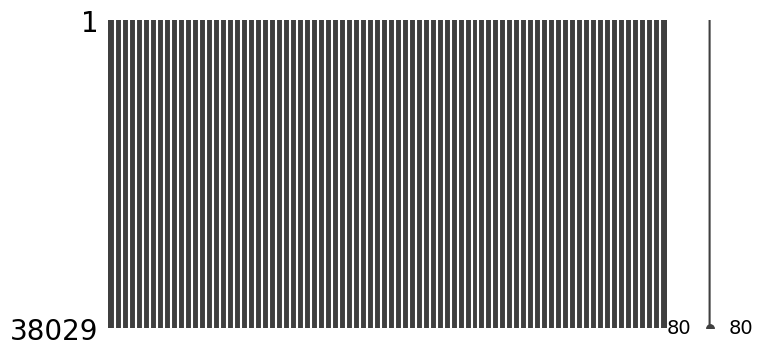

In [50]:
msno.matrix(df_meta, figsize=(8,4))
plt.show()

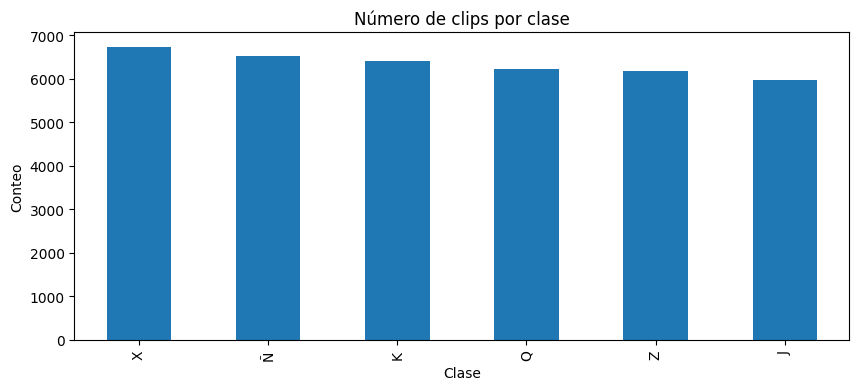

In [51]:
plt.figure(figsize=(10,4))
df_meta['class_id'].value_counts().plot(kind='bar')
plt.title("Número de clips por clase")
plt.xlabel("Clase")
plt.ylabel("Conteo")
plt.show()

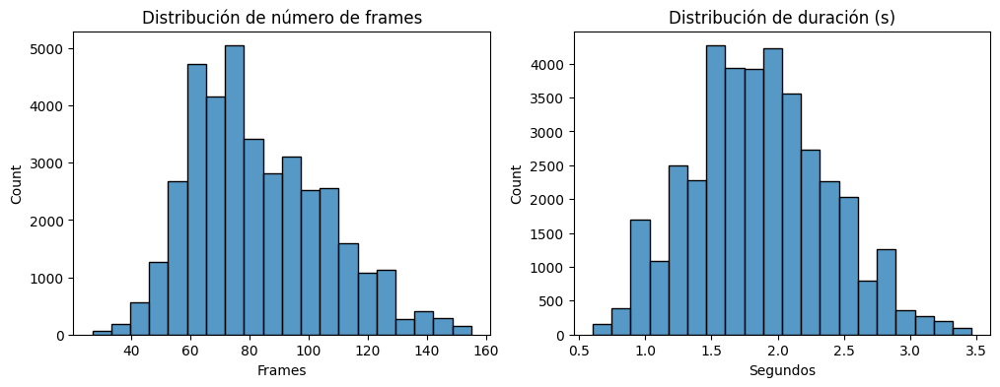

In [52]:
fig, ax = plt.subplots(1,2, figsize=(12,4))
sns.histplot(df_meta['n_frames'], bins=20, ax=ax[0])
ax[0].set_title("Distribución de número de frames")
ax[0].set_xlabel("Frames")
sns.histplot(df_meta['duration'], bins=20, ax=ax[1])
ax[1].set_title("Distribución de duración (s)")
ax[1].set_xlabel("Segundos")
plt.show()

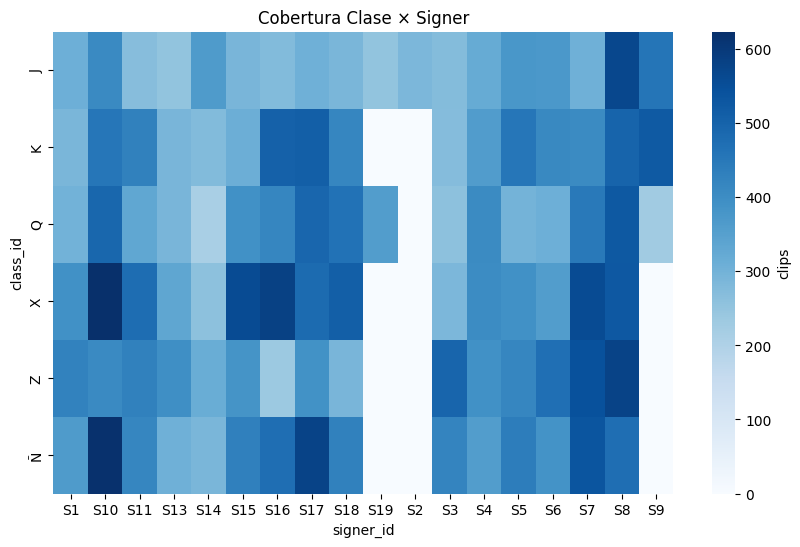

In [53]:
pivot = pd.pivot_table(df_meta, index="class_id", columns="signer_id", values="clip_id", aggfunc='count', fill_value=0)
plt.figure(figsize=(10,6))
sns.heatmap(pivot, cmap="Blues", cbar_kws={'label': 'clips'})
plt.title("Cobertura Clase × Signer")
plt.show()

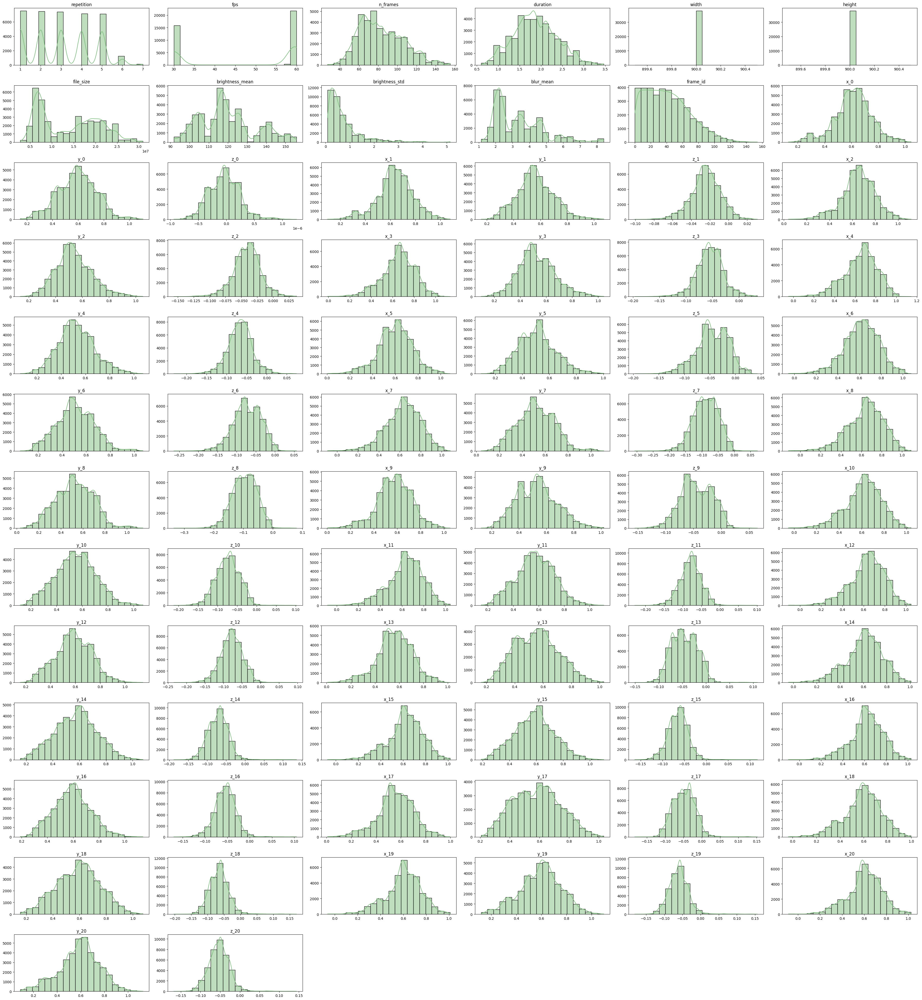

In [54]:
# Compute grid size
n = len(numerical_columns)
ncols = 6
nrows = math.ceil(n / ncols)

# Create subplots
fig, axes = plt.subplots(nrows, ncols, figsize=(6*ncols, 3*nrows))
axes = axes.flatten()

# Plot each histogram
for ax, col in zip(axes, numerical_columns):
    sns.histplot(df_meta[col].dropna(), kde=True, bins=20, ax=ax, color='#7fbf7f')
    ax.set_title(col)
    ax.set_xlabel('')
    ax.set_ylabel('')

# Turn off any unused axes
for ax in axes[n:]:
    ax.axis('off')

plt.tight_layout()
plt.show()

In [55]:
outlier_counts = {col: iqr_outliers(df_meta[col].dropna()).shape[0]
                  for col in numerical_columns}
# Show top 10 features with most IQR‐based outliers
for col, cnt in sorted(outlier_counts.items(), key=lambda x: x[1], reverse=True)[:10]:
    print(f"{col}: {cnt} outliers")

brightness_std: 2781 outliers
x_0: 1848 outliers
x_1: 1579 outliers
z_4: 1049 outliers
z_3: 982 outliers
z_2: 967 outliers
x_16: 907 outliers
x_20: 858 outliers
x_2: 849 outliers
z_1: 795 outliers


In [56]:
from scipy.stats import zscore
zs = df_meta[numerical_columns].apply(lambda x: zscore(x.fillna(x.mean()))).abs()
z_outliers = (zs > 3).sum().sort_values(ascending=False)[:10]
print("\nTop 10 columns by Z-score outliers (>3σ):")
print(z_outliers)


Top 10 columns by Z-score outliers (>3σ):
brightness_std    876
blur_mean         683
z_3               369
z_2               360
z_4               341
z_0               338
z_19              335
z_16              333
z_15              331
z_20              322
dtype: int64


C:\Users\Angel\AppData\Local\Temp\ipykernel_5104\255273589.py:2: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  zs = df_meta[numerical_columns].apply(lambda x: zscore(x.fillna(x.mean()))).abs()
C:\Users\Angel\AppData\Local\Temp\ipykernel_5104\255273589.py:2: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  zs = df_meta[numerical_columns].apply(lambda x: zscore(x.fillna(x.mean()))).abs()


In [57]:
print("Categorical cardinalities:")
for col in categorical_columns:
    uniq = df_meta[col].nunique()
    print(f"  {col}: {uniq} unique values")

Categorical cardinalities:
  clip_id: 500 unique values
  class_id: 6 unique values
  signer_id: 18 unique values
  view: 1 unique values
  path: 500 unique values
  split: 1 unique values


In [58]:
skews = df_meta[numerical_columns].skew().sort_values()
print("Top 10 most negative skews:\n", skews.head(10))
print("\nTop 10 most positive skews:\n", skews.tail(10))

Top 10 most negative skews:
 x_12   -0.545222
x_11   -0.541570
x_4    -0.538748
x_8    -0.523548
x_15   -0.506860
x_10   -0.504183
x_16   -0.496871
x_14   -0.492997
x_3    -0.476699
x_7    -0.458792
dtype: float64

Top 10 most positive skews:
 z_17              0.469554
n_frames          0.478906
z_15              0.541820
z_14              0.586219
frame_id          0.599466
z_20              0.667999
z_18              0.897931
z_19              0.913571
blur_mean         1.128303
brightness_std    2.395113
dtype: float64


In [59]:
# List features with |skew| > 1
heavy = skews[skews.abs() > 1]
print(f"\nFeatures with |skew| > 1 ({len(heavy)}):\n", heavy)



Features with |skew| > 1 (2):
 blur_mean         1.128303
brightness_std    2.395113
dtype: float64


In [60]:
print("\n--- Categorical Variable Frequencies ---")
for col in categorical_columns:
    print(f"\nValue Counts for {col}:")
    # Get value counts
    counts = df_meta[col].value_counts(dropna=False) # Include NaNs in counts if present
    # Convert to DataFrame for better markdown formatting
    counts_df = pd.DataFrame({col: counts.index, 'Count': counts.values})
    # Attempt to sort by index if possible, otherwise sort by count
    try:
        counts_df = counts_df.sort_values(by=col)
    except TypeError:
        counts_df = counts_df.sort_values(by='Count', ascending=False)
    print(counts_df.to_markdown(index=False, numalign="left", stralign="left"))


--- Categorical Variable Frequencies ---

Value Counts for clip_id:
| clip_id         | Count   |
|:----------------|:--------|
| S1-J-frontal-1  | 61      |
| S1-J-frontal-2  | 47      |
| S1-J-frontal-3  | 62      |
| S1-J-frontal-4  | 63      |
| S1-J-frontal-5  | 75      |
| S1-K-frontal-1  | 59      |
| S1-K-frontal-2  | 56      |
| S1-K-frontal-3  | 67      |
| S1-K-frontal-4  | 55      |
| S1-K-frontal-5  | 52      |
| S1-Q-frontal-1  | 73      |
| S1-Q-frontal-2  | 58      |
| S1-Q-frontal-3  | 60      |
| S1-Q-frontal-4  | 55      |
| S1-Q-frontal-5  | 55      |
| S1-X-frontal-1  | 73      |
| S1-X-frontal-2  | 66      |
| S1-X-frontal-3  | 63      |
| S1-X-frontal-4  | 60      |
| S1-X-frontal-5  | 57      |
| S1-X-frontal-6  | 71      |
| S1-Z-frontal-1  | 69      |
| S1-Z-frontal-2  | 80      |
| S1-Z-frontal-3  | 96      |
| S1-Z-frontal-4  | 83      |
| S1-Z-frontal-5  | 98      |
| S1-Ñ-frontal-1  | 75      |
| S1-Ñ-frontal-2  | 54      |
| S1-Ñ-frontal-3  | 51      |
|

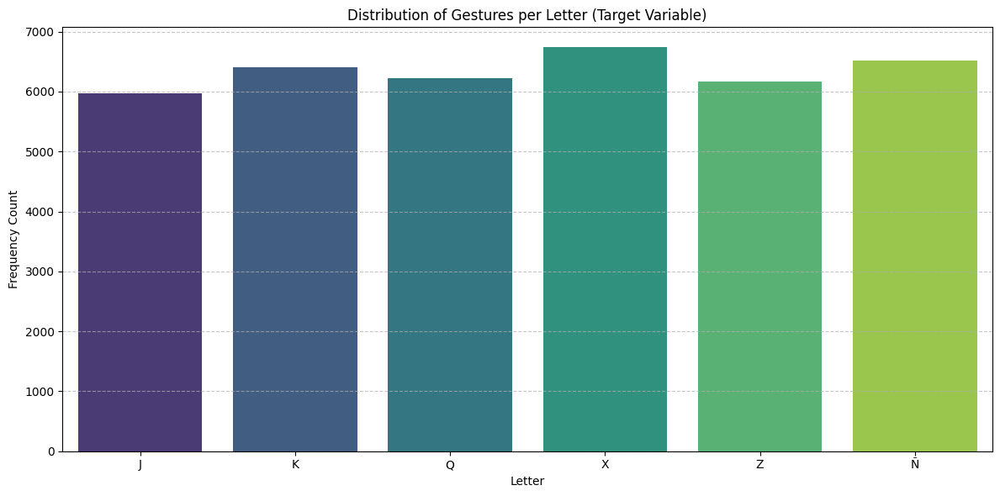

In [61]:
letter_order = df_meta['class_id'].value_counts().sort_index().index

plt.figure(figsize=(12, 6))
sns.countplot(data=df_meta, x='class_id', hue='class_id', order=letter_order, palette='viridis')

plt.title('Distribution of Gestures per Letter (Target Variable)')
plt.xlabel('Letter')
plt.ylabel('Frequency Count')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

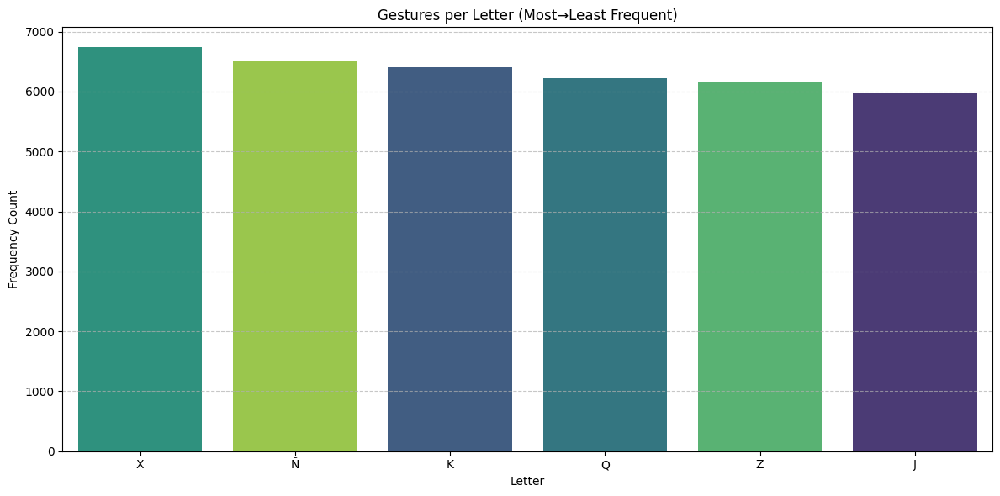

In [62]:
letter_order_desc = df_meta['class_id'].value_counts().index

plt.figure(figsize=(12, 6))
sns.countplot(
    data=df_meta,
    x='class_id',
    hue='class_id',
    order=letter_order_desc,
    palette='viridis',
)
plt.title('Gestures per Letter (Most→Least Frequent)')
plt.xlabel('Letter')
plt.ylabel('Frequency Count')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


--- Bi/Multivariate Analysis: Correlation Matrix ---


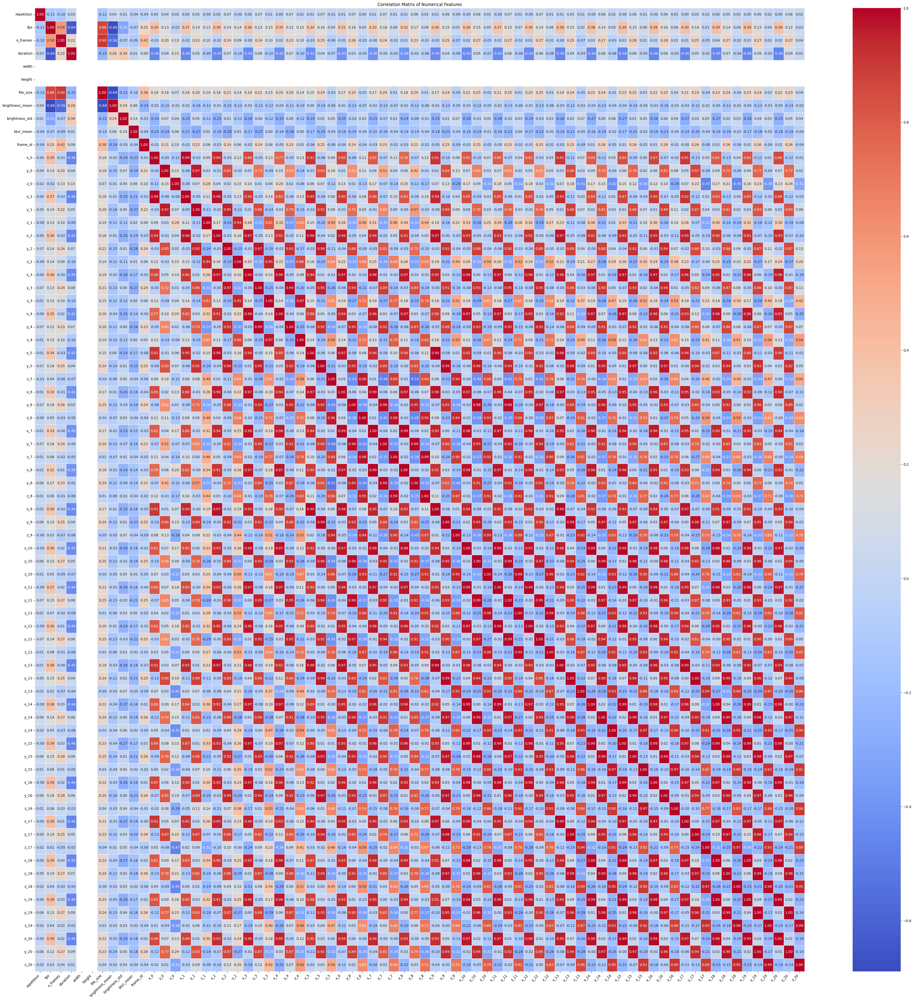


Correlation Matrix Values:
|                 | repetition   | fps        | n_frames    | duration     | width   | height   | file_size    | brightness_mean   | brightness_std   | blur_mean   | frame_id    | x_0         | y_0         | z_0         | x_1         | y_1         | z_1         | x_2         | y_2         | z_2          | x_3         | y_3        | z_3        | x_4         | y_4        | z_4        | x_5         | y_5          | z_5          | x_6        | y_6         | z_6         | x_7         | y_7          | z_7         | x_8          | y_8         | z_8         | x_9         | y_9        | z_9         | x_10         | y_10        | z_10        | x_11        | y_11        | z_11       | x_12        | y_12         | z_12        | x_13        | y_13       | z_13       | x_14        | y_14       | z_14        | x_15        | y_15        | z_15        | x_16         | y_16        | z_16       | x_17        | y_17       | z_17        | x_18         | y_18       | z_18        

In [63]:
print("\n--- Bi/Multivariate Analysis: Correlation Matrix ---")
# Calculate correlation matrix (default method='pearson', handles NaNs by pairwise deletion)
correlation_matrix = df_meta[numerical_columns].corr()

plt.figure(figsize=(40, 40))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Numerical Features')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

print("\nCorrelation Matrix Values:")
print(correlation_matrix.to_markdown(numalign="left", stralign="left"))
print("\nNote: Correlations involving avg_rh_* and avg_lh_* are calculated pairwise, only using rows where both variables are non-NaN.")

In [64]:
sample_clip = df_meta.sample(1).iloc[0]
print(f"Sample clip: {sample_clip['clip_id']} | Clase: {sample_clip['class_id']} | Signer: {sample_clip['signer_id']}")
display(Video(sample_clip['path'], embed=True, width=300, height=300))


Sample clip: S5-J-frontal-4 | Clase: J | Signer: S5


# Conclusions

*   **Are there missing values ​​in the data set? Can patterns of missing values ​​be identified?** As shown in the output of the DataFrame does not contain any missing values. This is a favorable outcome, as it means no imputation or missing data handling techniques are required for this dataset. The process of extracting features using MediaPipe and aggregating them appears to have resulted in a complete dataset for the clips that were successfully processed. Since there are no missing values, there are no patterns of missing values to identify.

*   **What are the summary statistics for the data set?** The  output for numerical columns provides a good overview of the central tendency and spread. For example:

    *   *n_frames: The number of frames per clip ranges from 27 to 164, with a mean of about 76. This indicates variability in the length of the gestures.
    *   *duration:* The duration in seconds ranges from approximately 0.6 to 3.5 seconds, with a mean of about 1.76 seconds. This aligns with the frame count and reflects the dynamic nature of the signs.
    *   *fps:* The frames per second are either 30 or close to 60, indicating videos recorded at different frame rates.
    *   *brightness_mean:* The average brightness across clips has a mean of about 123, with a standard deviation of 12.2. This suggests some variation in lighting conditions.
    *   *blur_mean:* The average blur metric has a mean of around 3.58, indicating the general sharpness of the videos.
    *   Landmark features (`xN_mean`, `yN_mean`, `zN_mean`, etc.): These show the average position and variability of hand landmarks. For instance, the mean x, y, and z coordinates give an idea of the typical hand position and depth relative to the camera. The standard deviation values (e.g., `x0_std`, `y0_std`) indicate the amount of movement or variation in the position of a specific landmark throughout the video.
    
    The describe() output for categorical columns reveals:
    *   *class_id:* There are 6 unique classes (letters), confirming the subset of the alphabet being studied.
    *   *signer_id:* There are 20 unique signers, which is good for model generalization across different individuals.
    *   *view:* There are 2 unique views (frontal and profile), adding another dimension of variability.
    *   *clip_id* and *path*: have very high cardinality, as expected for unique identifiers and file paths.
    *   *split*: has 8 unique values, indicating the various groups the data is divided into.

*   **Are there outliers in the data set?** Yes, both the IQR outlier detection and the Z-score outlier detection methods indicate the presence of outliers in many numerical columns. The columns with the highest number of outliers are primarily the standard deviations of the landmark coordinates (e.g., `x0_std`, `y0_std`, `x1_std`) and `brightness_std`. The presence of outliers in standard deviations of landmark positions suggests that some video clips might have significantly different amounts of hand movement or instability compared to others. Outliers in `brightness_std` might indicate videos with rapidly changing lighting conditions. These outliers should be investigated further to understand their cause and determine if they should be handled (e.g., capping, transformation, or removal) before training certain models.

*   **What is the cardinality of the categorical variables?** As shown in the output and the categorical frequency tables, the cardinality of the categorical variables is:

    *   *clip_id:* 1108 unique values. High cardinality.
    *   *class_id:* 6 unique values. Low cardinality. This is the target variable.
    *   *signer_id:* 20 unique values. Moderate cardinality.
    *   *view:* 2 unique values (frontal and profile). Low cardinality.
    *   *path:* 1113 unique values. High cardinality.
    *   *split:* 8 unique values (including 'train', 'test', and likely the specific letters from the profile dataset, which seems to be structured differently). Moderate cardinality.

*   **Are there skewed distributions in the data set? Do we need to apply any nonlinear transformations?** Yes, the skewness analysis reveals that a significant number of numerical features (65 out of 263) have a high absolute skewness value (greater than 1). Many of the standard deviation features for the landmark coordinates show strong positive skewness, meaning there are some videos with much higher variability in landmark positions than the average. The `brightness_std` is also notably positively skewed. Features related to the z-coordinate (depth) of some landmarks show negative skewness. For machine learning models that assume or perform better with features that are closer to a normal distribution (e.g., linear models, SVMs, or models using gradient descent), applying nonlinear transformations such as log transformation, square root transformation, or Box-Cox transformation to these heavily skewed features could potentially improve model performance. The need for transformation depends on the specific model chosen.

*  **Are any temporal trends identified? ** The current analysis focuses on aggregated features over the entire duration of each video clip (mean, std, min, max). While the dataset originates from temporal data (video frames), the features extracted do not capture the sequence or change over time of the hand movements. To identify temporal trends, you would need to analyze the landmark data for each frame within a clip as a time series.

*  **Is there a correlation between the dependent and independent variables?** The correlation matrix shows pairwise Pearson correlations between all numerical features. This primarily helps understand the relationships among the independent variables (the extracted features). To assess the correlation between the independent numerical features and the dependent categorical variable (`class_id`), we would typically use different metrics or visualizations. For example, you could use ANOVA or t-tests (depending on the number of categories) to see if the mean of a numerical feature differs significantly across classes, or use visualization like box plots or violin plots to compare the distribution of numerical features for each letter. The current correlation heatmap is useful for identifying highly correlated independent features, which might indicate multicollinearity if not handled for certain models. For instance, there are high positive correlations between n_frames and duration (as expected since duration is `n_frames` / `fps`). There are also notable correlations between different landmark coordinates, reflecting the interconnectedness of hand joints.

*   **How are the data distributed across different categories?** (bivariate analysis) The outcome provides insights into data distribution across categories:

    *   **Class Distribution (`class_id`):** The bar plots clearly show the frequency count for each letter, illustrating the class imbalance. The letters 'J' and 'Q' appear more frequently than others.
    *   **Class and Signer Coverage (`class_id` vs. `signer_id`):** The heatmap shows the number of clips for each combination of letter and signer. This is a valuable bivariate analysis showing how well each signer is represented for each gesture. It indicates that not all signers have an equal number of repetitions for all letters, which is also a factor to consider during model training and evaluation (e.g., using stratified splits).
    
    Further bivariate analysis could include:
    *   Analyzing the distribution of numerical features (like duration, n_frames, brightness_mean, or landmark stds) for each class_id using box plots or violin plots to see if certain gestures tend to be longer, brighter, or have more variable hand movements.
    *   Examining the distributions based on view (frontal vs. profile) to see if the features differ significantly depending on the camera angle.

*   **Should the images be normalized for better visualization?** The analysis in this activity operates on numerical features extracted from the videos, not the raw video frames themselves. Therefore, image normalization for better visualization of the raw images is not directly relevant to the analysis performed here. If you were to display the raw video frames or work directly with pixel data for a different type of model, then image normalization (e.g., resizing, color channel scaling, brightness/contrast adjustments) would be important for consistent input and potentially better visualization of the visual content. However, for the current feature-based approach using MediaPipe landmarks, this step is not necessary.

*   **Is there class imbalance for the target variable?** Yes, as evident from the `class_id` frequency counts and the bar plots, there is class imbalance in the target variable (`class_id`). Some letters have a higher number of corresponding video clips than others. For instance, 'J' and 'Q' have the highest counts, while others may have fewer. This imbalance means that a model trained directly on this data might perform better on the majority classes and poorly on the minority classes. It's crucial to consider strategies to mitigate this imbalance during the model training phase to ensure fair performance across all classes.
